### Problem Statement:

The data scientists at BigMart have collected 2013 sales data for 1559 products across 10 stores in different cities. Also, certain attributes of each product and store have been defined. The aim is to build a predictive model and find out the sales of each product at a particular store.

Using this model, BigMart will try to understand the properties of products and stores which play a key role in increasing the sales of their products.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# load csv file
bigdata=pd.read_csv("E:\\Data Science\\Data science Practise project\\bigdatamart_Train.csv")
bigdata.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [3]:
bigdata.shape

(8523, 12)

Our dataset has 8523 rows and 12 columns

In [4]:
bigdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [5]:
bigdata.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

 feature "Item weight" and "Outlet Size" has nan value, 'Item weight' is continous data type so we use imputation technique to fill Nan values, for feature "Outlet size" we use mode to fill Nan value, because 'Outlet size' is categorical feature

In [6]:
bigdata['Item_Weight']=bigdata['Item_Weight'].replace(np.nan,bigdata['Item_Weight'].mean())

In [7]:
mode=bigdata['Outlet_Size'].mode()
mode

0    Medium
dtype: object

In [8]:
bigdata['Outlet_Size']=bigdata['Outlet_Size'].fillna(mode[0])

In [9]:
bigdata.head(5)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


now check any nan value ie there or not

In [10]:
bigdata.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

Here we replaced all NaN values by mode and mean method

In [11]:
bigdata.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.226124,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,9.310000,0.026989,93.826500,1987.000000,834.247400
50%,12.857645,0.053931,143.012800,1999.000000,1794.331000
75%,16.000000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [12]:
pd.set_option('display.max_row',None)

In [13]:
bigdata['Item_Identifier'].value_counts()

FDG33    10
FDW13    10
FDT07     9
FDQ40     9
FDW49     9
FDF56     9
FDW26     9
FDP25     9
NCQ06     9
NCB18     9
FDX04     9
DRE49     9
NCJ30     9
FDO19     9
NCI54     9
FDV60     9
NCY18     9
FDU12     9
NCF42     9
FDF52     9
FDD38     9
NCL31     9
FDX20     9
FDG09     9
FDX31     9
FDV38     9
DRN47     9
FDL20     8
FDS55     8
FDZ26     8
FDB17     8
FDK20     8
DRD25     8
FDG57     8
FDZ21     8
NCP05     8
FDT21     8
FDL58     8
DRA59     8
FDD05     8
NCC18     8
FDP11     8
FDJ58     8
FDA15     8
NCQ43     8
FDP28     8
FDT24     8
FDO52     8
FDL10     8
FDN56     8
FDU13     8
DRK12     8
NCX29     8
FDJ55     8
FDT32     8
FDX58     8
FDU23     8
FDA44     8
NCB31     8
FDD29     8
FDL34     8
FDX21     8
FDZ20     8
FDO32     8
FDT55     8
NCY29     8
FDI22     8
FDV20     8
DRF01     8
FDT49     8
NCV41     8
FDY56     8
DRI03     8
FDF16     8
FDJ44     8
FDO10     8
DRF23     8
FDG38     8
DRJ24     8
FDY03     8
FDR43     8
FDQ39     8
NCM07     8
FDX5

In [14]:
bigdata.drop(columns=['Item_Identifier'],axis=1,inplace=True)

In [15]:
bigdata.shape

(8523, 11)

In [16]:
bigdata['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

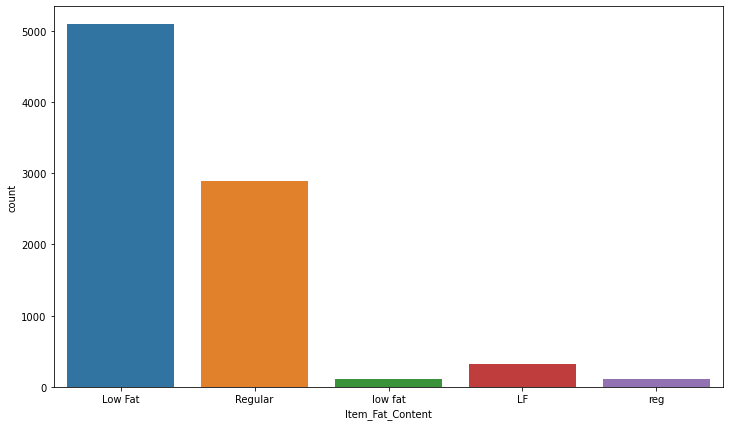

In [17]:
plt.figure(figsize=(12,7))  # lets plot countplot for label 'Item_Fat_Content'
sns.countplot(bigdata['Item_Fat_Content'])

In [18]:
bigdata['Item_Type'].value_counts()

Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64

<AxesSubplot:xlabel='Item_Type', ylabel='count'>

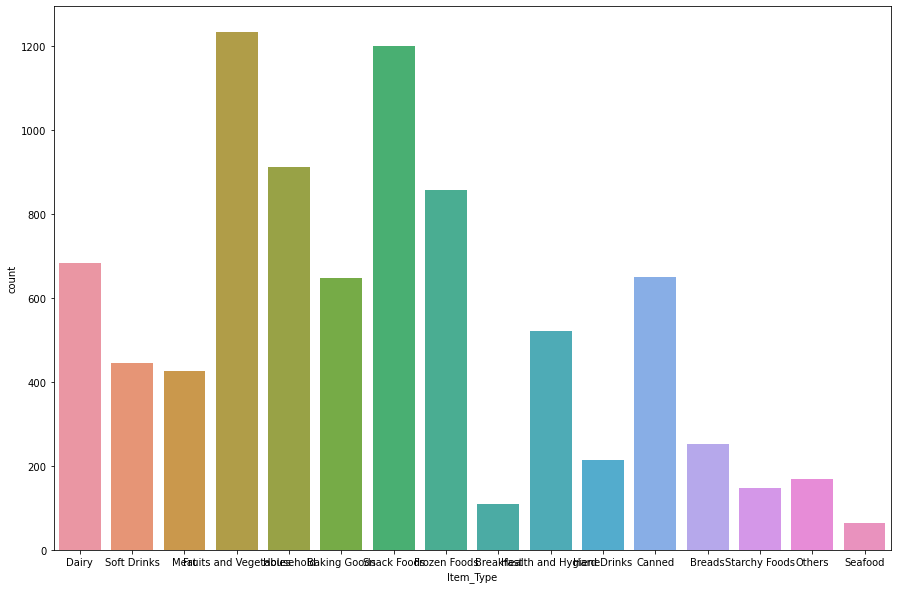

In [19]:
plt.figure(figsize=(15,10))  # lets plot countplot for label 'Item_Type'
sns.countplot(bigdata['Item_Type'])

In [20]:
bigdata['Outlet_Identifier'].value_counts()

OUT027    935
OUT013    932
OUT046    930
OUT049    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

<AxesSubplot:xlabel='Outlet_Identifier', ylabel='count'>

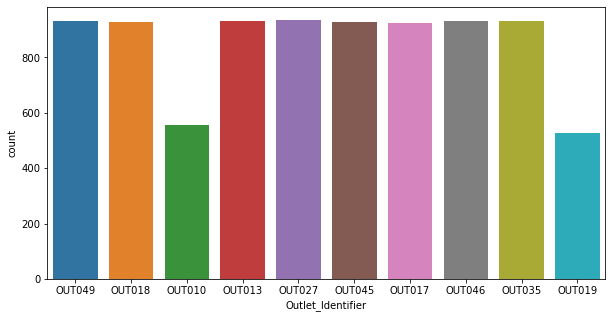

In [21]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Identifier'
sns.countplot(bigdata['Outlet_Identifier'])

In [22]:
bigdata['Outlet_Establishment_Year'].value_counts()

1985    1463
1987     932
1999     930
1997     930
2004     930
2002     929
2009     928
2007     926
1998     555
Name: Outlet_Establishment_Year, dtype: int64

<AxesSubplot:xlabel='Outlet_Establishment_Year', ylabel='count'>

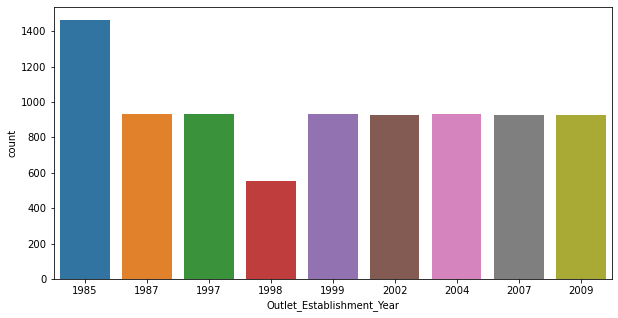

In [23]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Establishment_Year'
sns.countplot(bigdata['Outlet_Establishment_Year'])

In [24]:
bigdata['Outlet_Size'].value_counts()

Medium    5203
Small     2388
High       932
Name: Outlet_Size, dtype: int64

<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

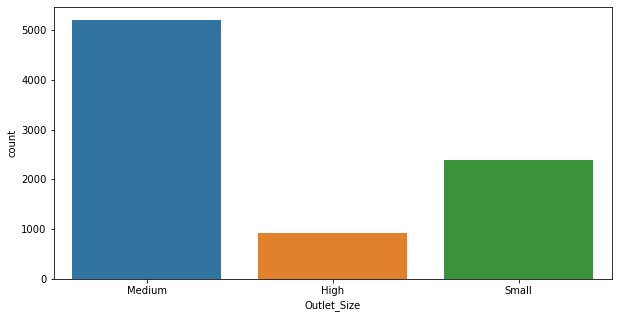

In [25]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Size'
sns.countplot(bigdata['Outlet_Size'])

In [26]:
bigdata['Outlet_Location_Type'].value_counts()

Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

<AxesSubplot:xlabel='Outlet_Location_Type', ylabel='count'>

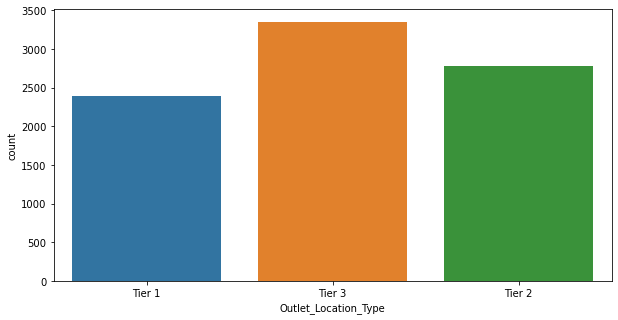

In [27]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Location_Type'
sns.countplot(bigdata['Outlet_Location_Type'])

In [28]:
#bigdata['Outlet_Location_Type'].replace('Tier 1',0,inplace=True)  # here we replace 'Tier 1'by 0
#bigdata['Outlet_Location_Type'].replace('Tier 2',1,inplace=True)  # here we replace 'Tier 2'by 1
#bigdata['Outlet_Location_Type'].replace('Tier 3 ',2,inplace=True)  # here we replace 'Tier 3'by 2


In [29]:
bigdata['Outlet_Type'].value_counts()

Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64

<AxesSubplot:xlabel='Outlet_Type', ylabel='count'>

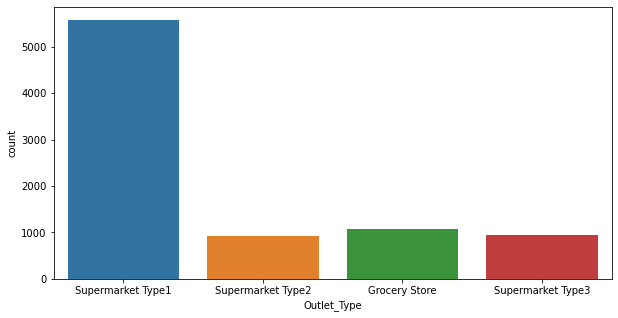

In [30]:

plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Type'
sns.countplot(bigdata['Outlet_Type'])

We have to use encoding technique to replace text data by numericals

### label "Item_Outlet_Sales" is having continous data type so, our problem is regression type 

In [31]:

bigdata.head()

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800
4,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [32]:
bigdata.isnull().sum()

Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

we again cross checked the data, if any column has null value or not

In [33]:
 bigdata=pd.get_dummies(data=bigdata, columns=['Item_Fat_Content','Item_Type','Outlet_Identifier','Outlet_Establishment_Year','Outlet_Size','Outlet_Location_Type','Outlet_Type'])

now we use one hot encoding for categorical feature , in columns we pass categorical feature, we see there is increase in the columns due to one hot encoding

In [34]:
bigdata.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Item_Fat_Content_LF,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Fat_Content_low fat,Item_Fat_Content_reg,Item_Type_Baking Goods,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,9.30,0.016047,249.8092,3735.1380,0,1,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,5.92,0.019278,48.2692,443.4228,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,17.50,0.016760,141.6180,2097.2700,0,1,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
3,19.20,0.000000,182.0950,732.3800,0,0,1,0,0,0,...,0,1,0,0,0,1,1,0,0,0
4,8.93,0.000000,53.8614,994.7052,0,1,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0


here we can see that number of columns increses from 11 to 54 due to one hot encoding

There are four continuos feature present in our dataset, lets implement distplot for continous features 

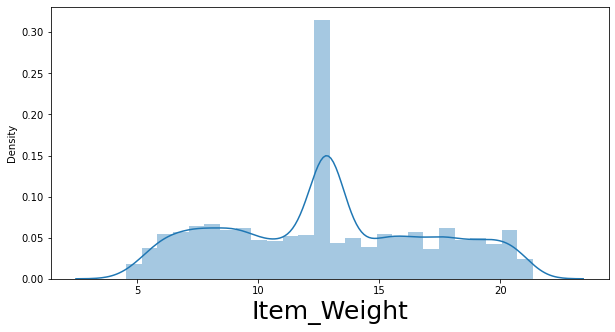

In [35]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

"Item weight" is continous data feature,its distribution is normal, so no skewness is present

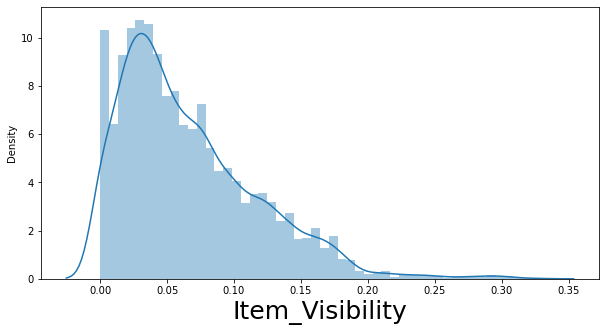

In [36]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

 feature " Item_Visibility" has right skewness distribution  in feature

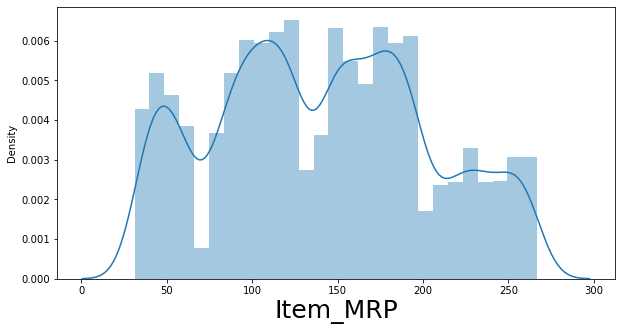

In [37]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

feature "Item_MRP"has normal distribution curve, no skewness present in the data

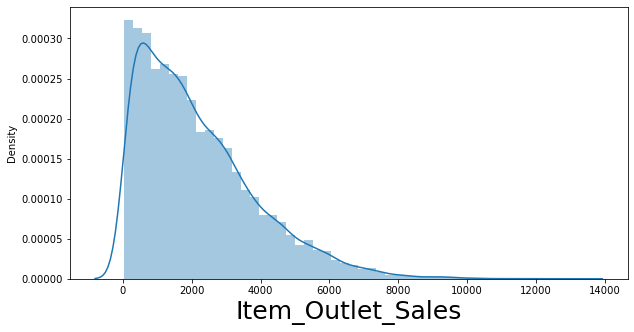

In [38]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Outlet_Sales'])
plt.xlabel('Item_Outlet_Sales',fontsize=25)
plt.show()

"Item Output_sales" is our Target label, we will not do any operation on label

Boxplot is univariate analysis, in which we can easily detect outliers,Boxplot has three quartile,It contains outlier below first quartile and above third quartile, in above boxplot, only feature "newspaper" has outlier above third quartile, remaining features has no outliers, we will not remove outlier of target columns

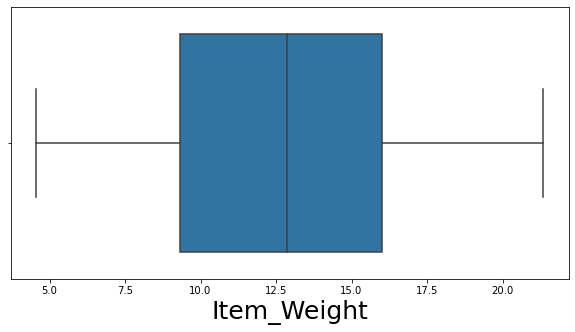

In [39]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

here we can see that no outliers are present in the dataset, it is very good for model building

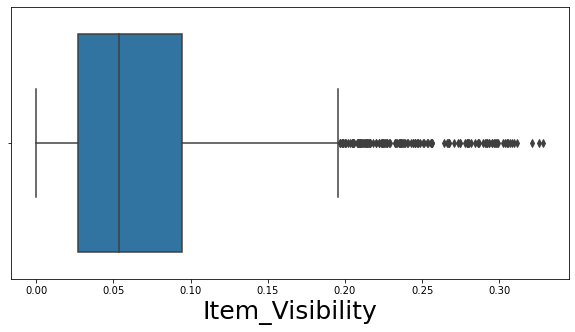

In [40]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

"Item _Visibility" has outlier above third quartile, we have to remove this outliers

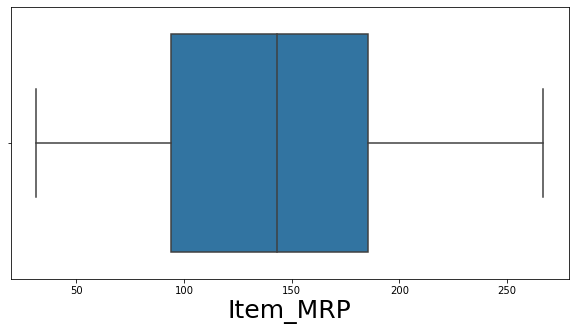

In [41]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

here we can see that no outliers are present in the dataset, it is very good for model building

In [43]:
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')
bigdata['Item_Weight']=scaler.fit_transform(bigdata['Item_Weight'].values.reshape(-1, 1))
bigdata['Item_Visibility']=scaler.fit_transform(bigdata['Item_Visibility'].values.reshape(-1, 1))
bigdata['Item_MRP']=scaler.fit_transform(bigdata['Item_MRP'].values.reshape(-1, 1))

power transformer is a monotonic transformation which is applied on data to make data Gaussian like by removing skewness, We us "Yeo_johnson" method which work on positive as well as on negative data, We pass three features for power transformer which are continous data type

In [44]:
bigdata.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Outlet_Sales                  0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
O

we again see is there any NAN value is created due to transformation, so no NAN value is created

In [45]:
# lets use z score to remove outliers
from scipy.stats import zscore # z score represent the number of  standard deviation with which value of observation differ than mean value
z=np.abs(zscore(bigdata['Item_Visibility']))
bigdata['Item_Visibility']=bigdata['Item_Visibility'][(z<3)]  # z score with std deviation =3

We can placed z score on normal distribution curve ranges from -3 standard deviation to the left of normal distribution curve to +3 S.D to right of normal distribution ,there we select z<3,and with value it cover almost 97.72 area of Distribution

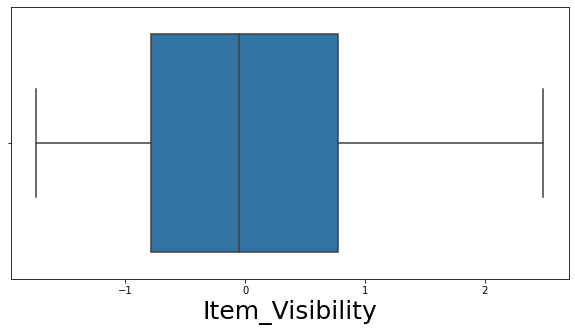

In [46]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

here we can see that skewness as well as outliers in the dataset are removed due power transformation

In [48]:
bigdata.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Outlet_Sales                  0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
O

now after removing skewness and Outlier we again visualize the distribution of continous features

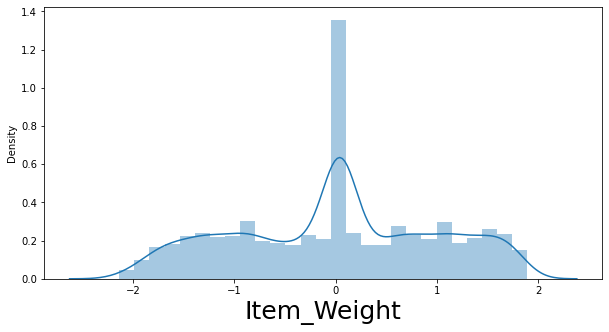

In [53]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

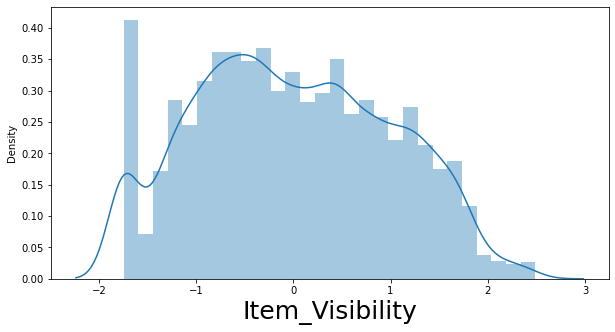

In [54]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

The distribution graph of "Item_Visibility" is now normal distribution curve

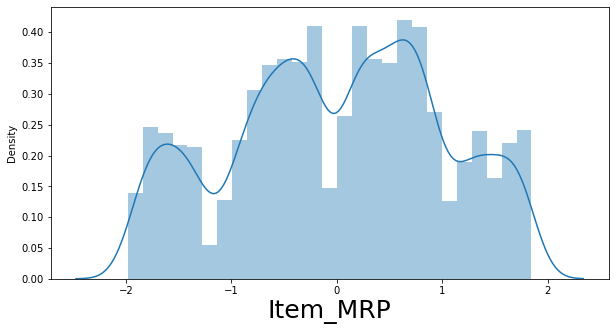

In [55]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

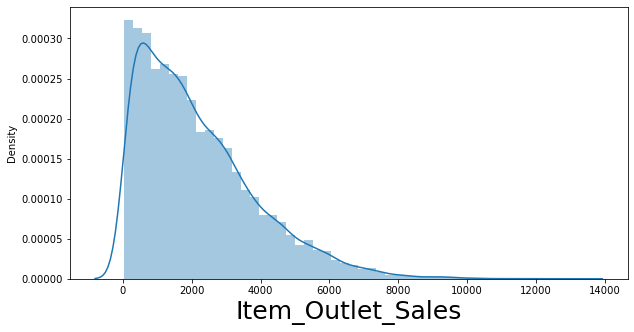

In [56]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata['Item_Outlet_Sales'])
plt.xlabel('Item_Outlet_Sales',fontsize=25)
plt.show()

In [57]:
bigdata.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Outlet_Sales                  0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
O

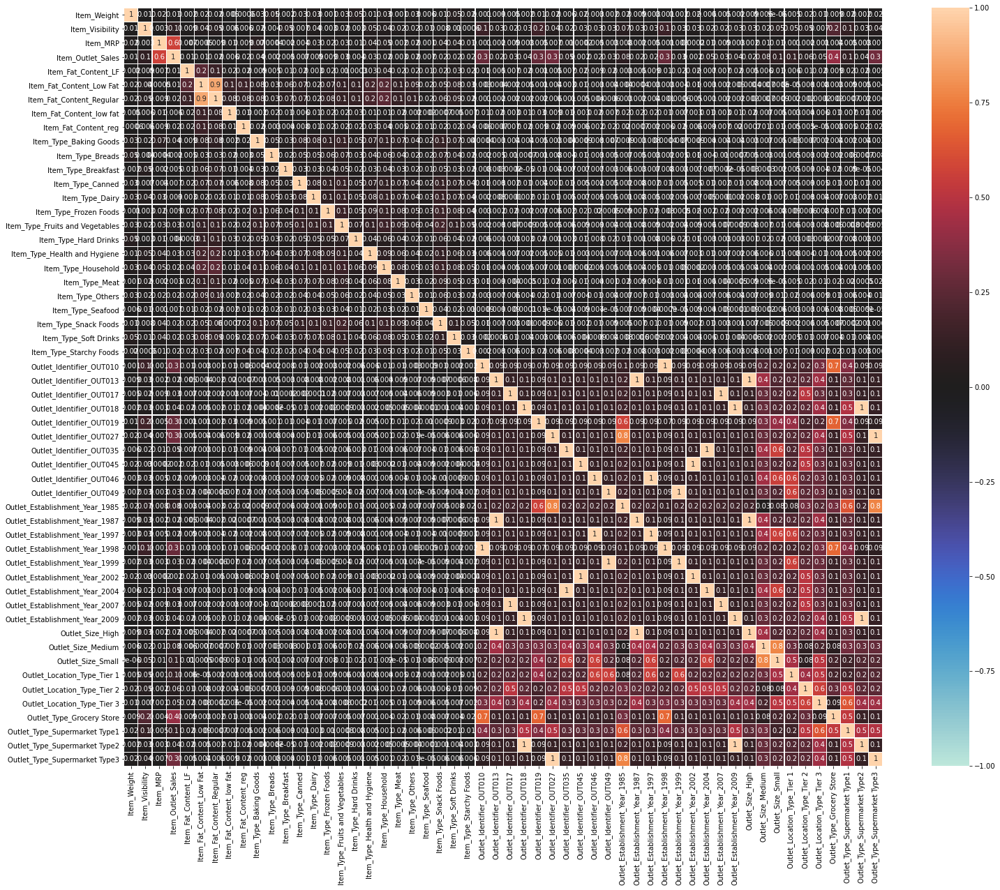

In [146]:
# lets plot heatmap which is multivaraiate analysis,find the coeffient of multicollinearity
bigdata_corr=bigdata.corr().abs()
plt.figure(figsize=(25,20))
sns.heatmap(bigdata_corr,vmin=-1,vmax=1,annot=True,square=True,center=0,fmt='.1g',linewidth=.1)
plt.show()

Heatmap is used to find correlation between independant variable and Target variable, value 1 indicate correlation of label verses label, 

In [144]:
corr_matrix=bigdata.corr()   # here we get values of correlation in descending order
corr_matrix['Item_Outlet_Sales'].sort_values(ascending=False)

Item_Outlet_Sales                  1.000000
Item_MRP                           0.566328
Outlet_Type_Supermarket Type3      0.311192
Outlet_Identifier_OUT027           0.311192
Outlet_Type_Supermarket Type1      0.108765
Outlet_Establishment_Year_1985     0.080669
Outlet_Size_Medium                 0.075154
Outlet_Location_Type_Tier 2        0.058261
Outlet_Establishment_Year_2004     0.052823
Outlet_Identifier_OUT035           0.052823
Outlet_Location_Type_Tier 3        0.046376
Outlet_Establishment_Year_1999     0.034264
Outlet_Identifier_OUT049           0.034264
Outlet_Identifier_OUT017           0.032610
Outlet_Establishment_Year_2007     0.032610
Item_Type_Fruits and Vegetables    0.025950
Outlet_Establishment_Year_1987     0.024170
Outlet_Identifier_OUT013           0.024170
Outlet_Size_High                   0.024170
Item_Type_Snack Foods              0.022782
Item_Fat_Content_Regular           0.022618
Outlet_Establishment_Year_1997     0.019803
Outlet_Identifier_OUT046        

first value 1 shows relation between label verses label, so ignore it. the value of correation ranges between -1 to +1, 1 shows strong positive correlation between variable,it means if one variable increses other also increase,-1 represent strong negative correlation between variable,it means if one variable value increase other goes on decreasing, value 0 or near to 0 represents no correlation between variable,

In [145]:
bigdata.skew()

Item_Weight                        -0.068024
Item_Visibility                     0.124279
Item_MRP                           -0.115386
Item_Outlet_Sales                   1.177531
Item_Fat_Content_LF                 4.900865
Item_Fat_Content_Low Fat           -0.395966
Item_Fat_Content_Regular            0.680513
Item_Fat_Content_low fat            8.552033
Item_Fat_Content_reg                8.359705
Item_Type_Baking Goods              3.199792
Item_Type_Breads                    5.567533
Item_Type_Breakfast                 8.632562
Item_Type_Canned                    3.196644
Item_Type_Dairy                     3.096356
Item_Type_Frozen Foods              2.659119
Item_Type_Fruits and Vegetables     2.021988
Item_Type_Hard Drinks               6.071724
Item_Type_Health and Hygiene        3.668801
Item_Type_Household                 2.547106
Item_Type_Meat                      4.136741
Item_Type_Others                    6.889767
Item_Type_Seafood                  11.411629
Item_Type_

skewness range is + 0.5 to -0.5 anything between this range is permissible and outside this range is high skewness,

In [58]:
list=['Item_Weight','Item_Visibility','Item_MRP']


In [59]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
bigdata[list]=scaler.fit_transform(bigdata[list])

MinMaxScaler removes the mean and scales each features to unit variance ,we got all transformed values,generally it is useful for those feature which has normal distribution

In [60]:
bigdata.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Item_Fat_Content_LF,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Fat_Content_low fat,Item_Fat_Content_reg,Item_Type_Baking Goods,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,0.326234,0.141313,0.941878,3735.1380,0,1,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,0.100114,0.167227,0.101813,443.4228,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,0.799982,0.147098,0.539309,2097.2700,0,1,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
3,0.889661,0.000000,0.698186,732.3800,0,0,1,0,0,0,...,0,1,0,0,0,1,1,0,0,0
4,0.302670,0.000000,0.132855,994.7052,0,1,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0


In [61]:
x=bigdata.drop(columns=['Item_Outlet_Sales'],axis=1)
y=bigdata['Item_Outlet_Sales']

x shows feature columns only, we drop target column "Sales" and store into y

In [62]:
x

,Item_Weight,Item_Visibility,Item_MRP,Item_Fat_Content_LF,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Fat_Content_low fat,Item_Fat_Content_reg,Item_Type_Baking Goods,Item_Type_Breads,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,0.326234,0.141313,0.941878,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,0.100114,0.167227,0.101813,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,0.799982,0.147098,0.539309,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
3,0.889661,0.000000,0.698186,0,0,1,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
4,0.302670,0.000000,0.132855,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
5,0.394577,0.000000,0.119321,0,0,1,0,0,1,0,...,0,1,0,0,0,1,0,0,1,0
6,0.587389,0.113953,0.153385,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
7,0.541712,0.707783,0.395482,0,1,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
8,0.729780,0.146508,0.346882,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
9,0.889661,0.594274,0.719750,0,0,1,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0


In [63]:
y

0        3735.1380
1         443.4228
2        2097.2700
3         732.3800
4         994.7052
5         556.6088
6         343.5528
7        4022.7636
8        1076.5986
9        4710.5350
10       1516.0266
11       2187.1530
12       1589.2646
13       2145.2076
14       1977.4260
15       1547.3192
16       1621.8888
17        718.3982
18       2303.6680
19       2748.4224
20       3775.0860
21       4064.0432
22       1587.2672
23        214.3876
24       4078.0250
25        838.9080
26       1065.2800
27        308.9312
28        178.4344
29        125.8362
30        163.7868
31       2741.7644
32       3068.0064
33       2174.5028
34       2085.2856
35       3791.0652
36       2797.6916
37       1609.9044
38        388.1614
39       2180.4950
40       3435.5280
41       2150.5340
42       2527.3768
43       6768.5228
44        373.5138
45        358.2004
46       2428.8384
47       5815.0972
48       2576.6460
49        780.3176
50       3134.5864
51        850.8924
52        81

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

Train test split is used to evaluate the performance of algorithm when we have large data,It divide the data into two set,training and testing phase, training data is used for fitting machine learning model and testing data is used for evaluating model performance r2 score is statistical measure that repesent proportion of variance for dependant variable

In [65]:
# finding best random state
from sklearn.tree import DecisionTreeRegressor
maxAccu=0  # initially max accuracy is set to 0
MaxRs=0  # initially Random state is set to 0
for i in range(1,200): # in for loop we pass 1 to 200 number out of which random state is selected
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=i) # used train_test_split in for loop
    mod=DecisionTreeRegressor()
    mod.fit(x_train,y_train)  # fit training data of feature and label to model decision tree
    pred=mod.predict(x_test) # predict label by using test features
    acc=r2_score(y_test,pred) # genrate accuracy score by comparing test label and predicted label
    if acc> maxAccu:
        maxAccu=acc # assign accuracy score to max accuracy
        MaxRs=i  # the number at which we get maxaccuracy is treated as random state
print('Best Accuracy is',maxAccu,"on Random state",MaxRs)

Best Accuracy is 0.2880761468439603 on Random state 197


In [66]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=MaxRs)

In train test split we pass x  and y output, test size is 25% and random state is MaxRs which is generated by above code

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from  sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor


In [68]:
# model instantiating and training
Linear_reg=LinearRegression()
Linear_reg.fit(x_train,y_train)
pred1=Linear_reg.predict(x_test)# predict output according test data
Linear_reg__score=r2_score(y_test,pred1) #here we compared y_test with predicted output
print(Linear_reg__score)

0.5655330877392183


Linear Regression is a algorithm used to predict data value by analysing one or more the independant features or variables

In [69]:
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)# fit training data to classifier
pred2=DTR.predict(x_test)# predict output according test data
DTR__score=r2_score(y_test,pred2) #here we compared y_test with predicted output
print(DTR__score)

0.2915506914711419


Decision Tree builds model in the form of tree structure,it divide the dataset into smaller and smaller subset, we determine the root node,then split the subsets,repeat the process till all instance have same class

In [70]:
KNR=KNeighborsRegressor()
KNR.fit(x_train,y_train)# fit training data to classifier
pred3=KNR.predict(x_test)# predict output according test data
KNR__score=r2_score(y_test,pred3) #here we compared y_test with predicted output
print(KNR__score)

0.4502484525484868


KNN store all cases and classify new model based on distance(Euclidean method),classification done by majority of votes neighbors

In [71]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)# fit training data to classifier
pred4=RFR.predict(x_test)# predict output according test data
RFR__score=r2_score(y_test,pred4) #here we compared y_test with predicted output
print(RFR__score)

0.559769533623842


RFR is ensemble algorithm which combines more than one algorithm of same or different kind.Random Forest gives outcome based on predictions of number of models by taking mean of output from various trees

In [72]:
ABR=AdaBoostRegressor()
ABR.fit(x_train,y_train)# fit training data to classifier
pred5=ABR.predict(x_test)# predict output according test data
ABR__score=r2_score(y_test,pred5) #here we compared y_test with predicted output
print(ABR__score)

0.5488389646739131


In [73]:
from sklearn.model_selection import cross_val_score

CV is a technique used to check whether model is overfitted or not, if model accuracy is high, then there is chances of model is overfitted.We use CV score for every model,for this we require model,features and labels, cv is cross validation spliting strategy.finally it take mean of all iteration and return cv score

In [74]:
Linear_regression_cv_score=cross_val_score(Linear_reg,x,y,cv=5).mean() # we pass model,feature,target and cv=5 means 4 set for training and 1 for testing
Linear_regression_cv_score

0.5566223100655714

In [75]:
DTR_CV_score=cross_val_score(DTR,x,y,cv=5).mean() # we pass model Decision Tree Regressor,feature,target and cv=5 means 4 set for training and 1 for testing
DTR_CV_score

0.19578987184081076

In [76]:
KNR_CV_score=cross_val_score(KNR,x,y,cv=5).mean() # we pass model,feature,target and cv=5 means 4 set for training and 1 for testing
KNR_CV_score

0.4596557606366032

In [77]:
RFR_CV_score=cross_val_score(RFR,x,y,cv=5).mean() # we pass model Random Forest Regressor,feature,target and cv=5 means 4 set for training and 1 for testing
RFR_CV_score

0.5540425361668728

In [78]:
ABR_CV_score=cross_val_score(ABR,x,y,cv=5).mean() # we pass model Random Forest Regressor,feature,target and cv=5 means 4 set for training and 1 for testing
ABR_CV_score

0.4023647336940909

In [79]:
Linear_regression_diff=Linear_reg__score*100-Linear_regression_cv_score*100
print('Linear_regression_diff',Linear_regression_diff)
KNR_diff=KNR__score*100-KNR_CV_score*100
print('KNR_diff',KNR_diff)
DTR_diff=DTR__score*100-DTR_CV_score*100
print("DTR_diff",DTR_diff)
RFR_diff=RFR__score*100-RFR_CV_score*100
print("RFR_diff",RFR_diff)
ABR_diff=ABR__score*100-ABR_CV_score*100
print("ABR_diff",ABR_diff)
#SVR_diff=SVR__score*100-SVR_CV_score*100
#print("SVR_diff",SVR_diff)

Linear_regression_diff 0.8910777673646919
KNR_diff -0.9407308088116437
DTR_diff 9.576081963033111
RFR_diff 0.5726997456969087
ABR_diff 14.64742309798222


In [80]:
print("Linear_regression_score",Linear_reg__score)
print("Linear_regression_cv_score", Linear_regression_cv_score)
print("Linear_regression_diff", Linear_regression_diff)
print("-------------------------------------------------------------------------------------------")
print("KNR__score",KNR__score)
print("KNR_CV_score",KNR_CV_score)
print("KNR_diff",KNR_diff)
print("-------------------------------------------------------------------------------------------")
print("DTR__score",DTR__score)
print("DTR_CV_score", DTR_CV_score)
print("DTR_diff",DTR_diff)

print("-------------------------------------------------------------------------------------------")
print("RFR__score",RFR__score)
print("RFR_CV_score",RFR_CV_score)
print("RFR_diff", RFR_diff)
print("-------------------------------------------------------------------------------------------")

print("ABR__score",ABR__score)
print("ABR_CV_score",ABR_CV_score)
print("ABR_diff",ABR_diff)
print("-------------------------------------------------------------------------------------------")
#print("SVR__score",SVR__score)
#print("SVR_CV_score",SVR_CV_score) 
#print("SVR_diff",SVR_diff)


Linear_regression_score 0.5655330877392183
Linear_regression_cv_score 0.5566223100655714
Linear_regression_diff 0.8910777673646919
-------------------------------------------------------------------------------------------
KNR__score 0.4502484525484868
KNR_CV_score 0.4596557606366032
KNR_diff -0.9407308088116437
-------------------------------------------------------------------------------------------
DTR__score 0.2915506914711419
DTR_CV_score 0.19578987184081076
DTR_diff 9.576081963033111
-------------------------------------------------------------------------------------------
RFR__score 0.559769533623842
RFR_CV_score 0.5540425361668728
RFR_diff 0.5726997456969087
-------------------------------------------------------------------------------------------
ABR__score 0.5488389646739131
ABR_CV_score 0.4023647336940909
ABR_diff 14.64742309798222
-------------------------------------------------------------------------------------------


In [81]:
from sklearn.model_selection import GridSearchCV

now we will use hyperparameter tuning for two best model i.e Linear regression and Random Forest Regressor

In [82]:
from sklearn.linear_model import Lasso

In [83]:
parameters={'alpha':[0.0001,0.001,0.01,0.1,1,10],'random_state':np.arange(2,10)}
ls=Lasso()
clf=GridSearchCV(ls,parameters) # pass the parameter to GridSearch to find best parameter
clf.fit(x_train, y_train)  # fit feature and label training data
print(clf.best_params_) #we get best parameters

{'alpha': 1, 'random_state': 2}


we will pass best parameter to Lasso regression which is regularization method

In [84]:
ls=Lasso(alpha=1,random_state=2)  # apply the best parameter on lasso regression
ls.fit(x_train,y_train) # fit training data to lasso
ls.score(x_train,y_train) # find the scoreon the basis of training feature and labels
pred_ls=ls.predict(x_test) # predict output on the base of test feature
pred_ls
lss=r2_score(y_test,pred_ls) # comapre testing score and predicted score
lss*100

56.6970054609645

After Hyperparameter tuning , we get r2 score for linear regression is 56 to 57 percent

Now we will use hyperparameter tuning for Random Forest Regressor, here we pass following parameters

In [85]:
params={'n_estimators':[10,12,13,14],
       'criterion':['mse'],
       'max_depth':[10,13,15],
       'min_samples_leaf':[5,6,7],
       'min_samples_split':[10,11,12]}

In [86]:
Grid_RFR1=GridSearchCV(RandomForestRegressor(),param_grid=params,cv=5)
Grid_RFR1.fit(x_train,y_train)
Grid_RFR1.best_params_

{'criterion': 'mse',
 'max_depth': 10,
 'min_samples_leaf': 6,
 'min_samples_split': 12,
 'n_estimators': 14}

now we will pass best parameter for Random Forest regressor

In [147]:
Final_RFR1=RandomForestRegressor(criterion='mse',max_depth=10,min_samples_leaf= 6,min_samples_split=12,n_estimators=14)
Final_RFR1.fit(x_train,y_train)
final_pred=Final_RFR1.predict(x_test)
final_score=r2_score(y_test,final_pred)
print(final_score*100)

59.535564610925086


We get r2 score more than linear regression, so we will save Random Forest Regressor model

In [88]:
import joblib
joblib.dump(Final_RFR1,"Bigdata_train.pkl")

['Bigdata_train.pkl']

In [89]:
# now import test data for bigdatamart

# Now we use test dataset for same project, which does not contain output label, we will same step as used above, and predict labels

In [90]:
bigdata_Test=pd.read_csv("E:\\Data Science\Data science Practise project\\bigdatamart_Test.csv")
bigdata_Test.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,NaN,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3


In [91]:
bigdata_Test.shape

(5681, 11)

In [92]:
bigdata_Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5681 entries, 0 to 5680
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            5681 non-null   object 
 1   Item_Weight                4705 non-null   float64
 2   Item_Fat_Content           5681 non-null   object 
 3   Item_Visibility            5681 non-null   float64
 4   Item_Type                  5681 non-null   object 
 5   Item_MRP                   5681 non-null   float64
 6   Outlet_Identifier          5681 non-null   object 
 7   Outlet_Establishment_Year  5681 non-null   int64  
 8   Outlet_Size                4075 non-null   object 
 9   Outlet_Location_Type       5681 non-null   object 
 10  Outlet_Type                5681 non-null   object 
dtypes: float64(3), int64(1), object(7)
memory usage: 488.3+ KB


In [93]:
bigdata_Test.isnull().sum()

Item_Identifier                 0
Item_Weight                   976
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  1606
Outlet_Location_Type            0
Outlet_Type                     0
dtype: int64

In [94]:
bigdata_Test['Item_Weight']=bigdata_Test['Item_Weight'].replace(np.nan,bigdata_Test['Item_Weight'].mean())

In [95]:
mode1=bigdata_Test['Outlet_Size'].mode()
mode1

0    Medium
dtype: object

In [96]:
bigdata_Test['Outlet_Size']=bigdata_Test['Outlet_Size'].fillna(mode1[0])

In [97]:
bigdata_Test.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year
count,5681.000000,5681.000000,5681.000000,5681.000000
mean,12.695633,0.065684,141.023273,1997.828903
std,4.245189,0.051252,61.809091,8.372256
min,4.555000,0.000000,31.990000,1985.000000
25%,9.195000,0.027047,94.412000,1987.000000
50%,12.695633,0.054154,141.415400,1999.000000
75%,15.850000,0.093463,186.026600,2004.000000
max,21.350000,0.323637,266.588400,2009.000000


In [98]:
bigdata_Test.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
dtype: int64

In [99]:
bigdata_Test['Item_Identifier'].value_counts()

FDW10    8
FDP15    8
FDK57    8
FDN52    8
FDZ50    8
FDQ60    8
NCS41    8
DRF48    8
FDW15    7
FDT35    7
FDG28    7
FDF58    7
NCU29    7
FDY58    7
NCW05    7
FDI53    7
NCV18    7
DRE01    7
FDY43    7
FDD22    7
FDS08    7
DRC24    7
FDH52    7
DRL59    7
NCM42    7
DRM11    7
FDE39    7
FDC23    7
FDB47    7
FDL15    7
NCR42    7
FDW58    7
FDE38    7
NCX53    7
FDY32    7
FDQ04    7
FDU43    7
NCT53    7
FDM12    7
FDY09    7
FDN50    7
FDC37    7
FDR16    7
NCC55    7
FDR13    7
FDF28    7
FDD48    7
FDE21    7
FDU48    7
FDE52    7
NCM18    7
NCK31    7
FDI36    7
NCQ29    7
NCV42    7
FDM22    6
FDD45    6
FDZ14    6
FDF59    6
FDC56    6
FDA38    6
FDM09    6
FDP01    6
FDU45    6
FDD32    6
FDJ02    6
FDT51    6
FDY08    6
FDD20    6
FDO33    6
FDQ19    6
FDG40    6
NCL06    6
FDC60    6
FDH12    6
NCP14    6
FDJ33    6
NCL17    6
NCM55    6
FDV14    6
FDF38    6
NCP02    6
NCD30    6
FDH08    6
FDI05    6
FDM38    6
FDF17    6
FDW01    6
FDU31    6
FDV31    6
FDW40    6

In [100]:
bigdata_Test=bigdata_Test.drop(columns=['Item_Identifier'],axis=1)

In [101]:
bigdata_Test.head(5)

,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,20.750000,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,8.300000,reg,0.038428,Dairy,87.3198,OUT017,2007,Medium,Tier 2,Supermarket Type1
2,14.600000,Low Fat,0.099575,Others,241.7538,OUT010,1998,Medium,Tier 3,Grocery Store
3,7.315000,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,Medium,Tier 2,Supermarket Type1
4,12.695633,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3


In [102]:
bigdata_Test['Item_Fat_Content'].value_counts()

Low Fat    3396
Regular    1935
LF          206
reg          78
low fat      66
Name: Item_Fat_Content, dtype: int64

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

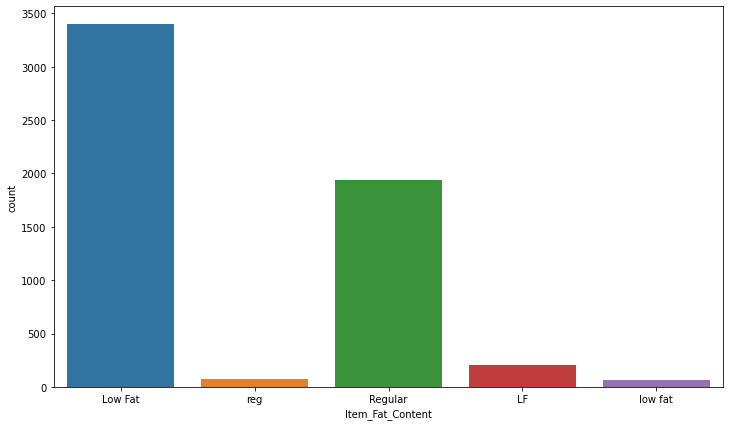

In [103]:
plt.figure(figsize=(12,7))  # lets plot countplot for label 'Item_Fat_Content'
sns.countplot(bigdata_Test['Item_Fat_Content'])

In [104]:
bigdata_Test['Item_Type'].value_counts()

Snack Foods              789
Fruits and Vegetables    781
Household                638
Frozen Foods             570
Dairy                    454
Baking Goods             438
Canned                   435
Health and Hygiene       338
Meat                     311
Soft Drinks              281
Breads                   165
Hard Drinks              148
Starchy Foods            121
Others                   111
Breakfast                 76
Seafood                   25
Name: Item_Type, dtype: int64

<AxesSubplot:xlabel='Item_Type', ylabel='count'>

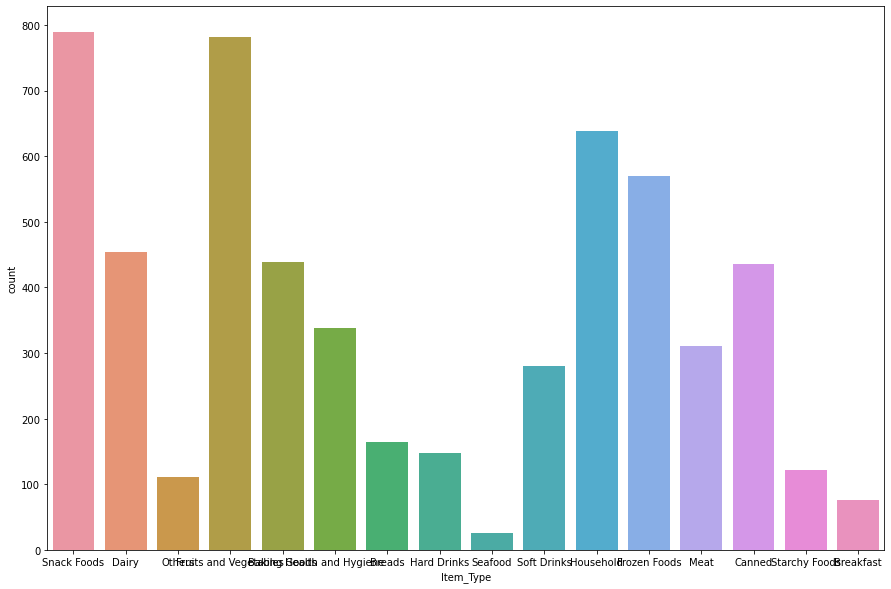

In [105]:
plt.figure(figsize=(15,10))  # lets plot countplot for label 'Item_Type'
sns.countplot(bigdata_Test['Item_Type'])

In [106]:
bigdata_Test['Outlet_Identifier'].value_counts()

OUT027    624
OUT013    621
OUT046    620
OUT049    620
OUT035    620
OUT045    619
OUT018    618
OUT017    617
OUT010    370
OUT019    352
Name: Outlet_Identifier, dtype: int64

<AxesSubplot:xlabel='Outlet_Identifier', ylabel='count'>

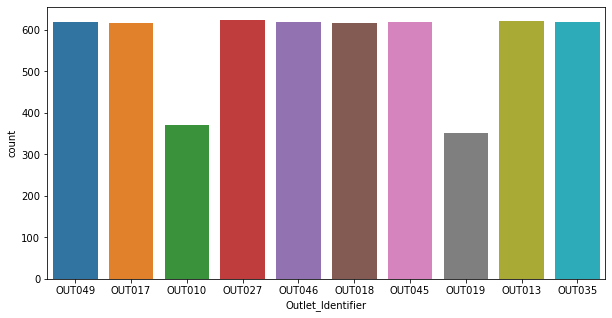

In [107]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Identifier'
sns.countplot(bigdata_Test['Outlet_Identifier'])

In [108]:
bigdata_Test['Outlet_Establishment_Year'].value_counts()

1985    976
1987    621
1999    620
1997    620
2004    620
2002    619
2009    618
2007    617
1998    370
Name: Outlet_Establishment_Year, dtype: int64

<AxesSubplot:xlabel='Outlet_Establishment_Year', ylabel='count'>

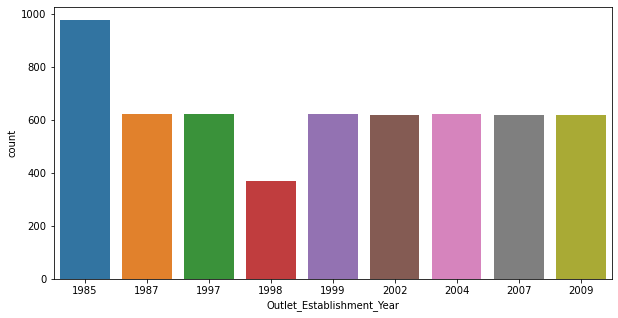

In [109]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Establishment_Year'
sns.countplot(bigdata_Test['Outlet_Establishment_Year'])

In [110]:
bigdata_Test['Outlet_Size'].value_counts()

Medium    3468
Small     1592
High       621
Name: Outlet_Size, dtype: int64

<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

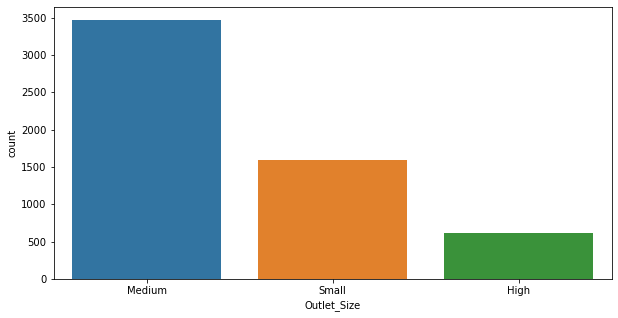

In [111]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Size'
sns.countplot(bigdata_Test['Outlet_Size'])

In [112]:
bigdata_Test['Outlet_Location_Type'].value_counts()

Tier 3    2233
Tier 2    1856
Tier 1    1592
Name: Outlet_Location_Type, dtype: int64

<AxesSubplot:xlabel='Outlet_Location_Type', ylabel='count'>

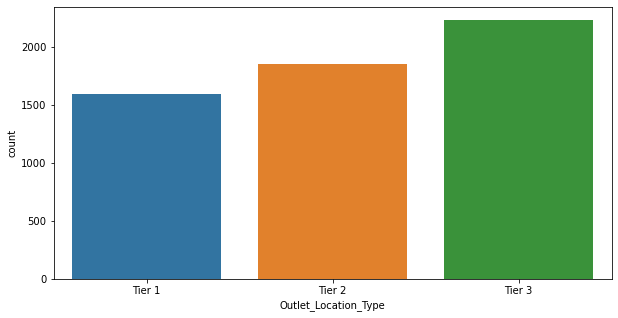

In [113]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Location_Type'
sns.countplot(bigdata_Test['Outlet_Location_Type'])

In [114]:
bigdata_Test['Outlet_Type'].value_counts()

Supermarket Type1    3717
Grocery Store         722
Supermarket Type3     624
Supermarket Type2     618
Name: Outlet_Type, dtype: int64

<AxesSubplot:xlabel='Outlet_Type', ylabel='count'>

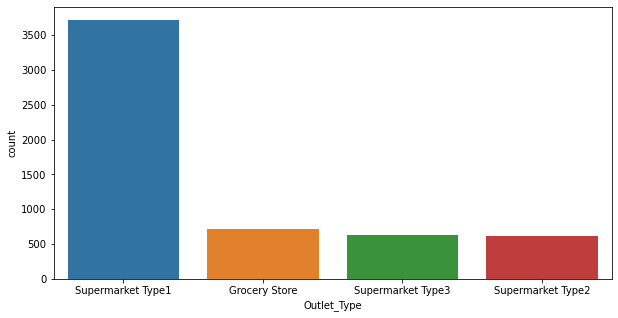

In [115]:
plt.figure(figsize=(10,5))  # lets plot countplot for label 'Outlet_Type'
sns.countplot(bigdata_Test['Outlet_Type'])

In [116]:
bigdata_Test.isnull().sum()

Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
dtype: int64

In [117]:
bigdata_Test=pd.get_dummies(data=bigdata_Test, columns=['Item_Fat_Content','Item_Type','Outlet_Identifier','Outlet_Establishment_Year','Outlet_Size','Outlet_Location_Type','Outlet_Type'])

In [118]:
bigdata_Test.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Fat_Content_LF,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Fat_Content_low fat,Item_Fat_Content_reg,Item_Type_Baking Goods,Item_Type_Breads,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,20.750000,0.007565,107.8622,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,8.300000,0.038428,87.3198,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,1,0,0
2,14.600000,0.099575,241.7538,0,1,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
3,7.315000,0.015388,155.0340,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
4,12.695633,0.118599,234.2300,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1


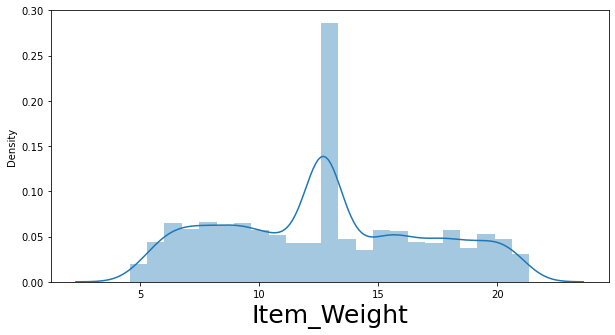

In [119]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

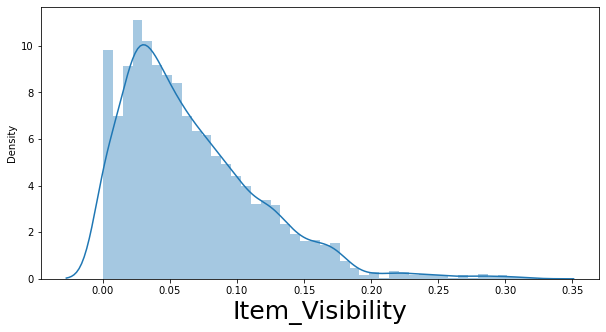

In [120]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

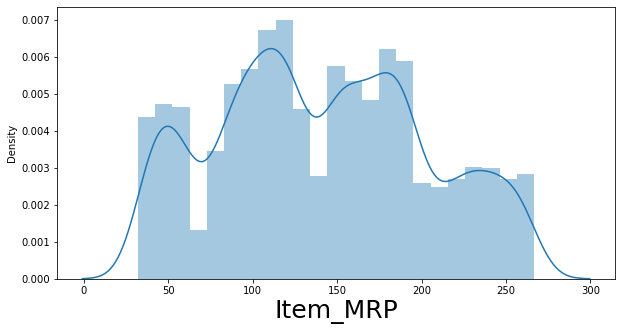

In [121]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

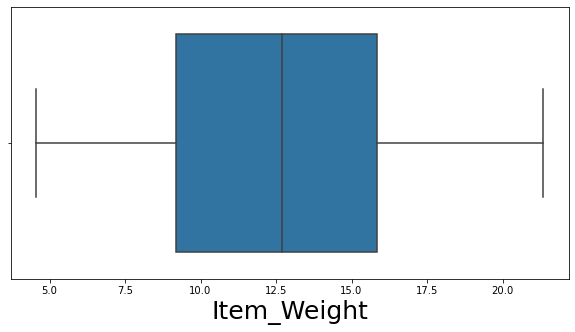

In [122]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata_Test['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

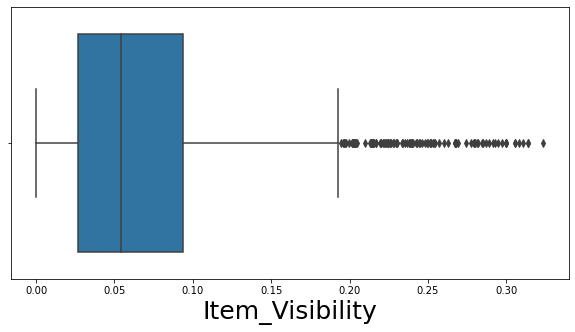

In [123]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata_Test['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

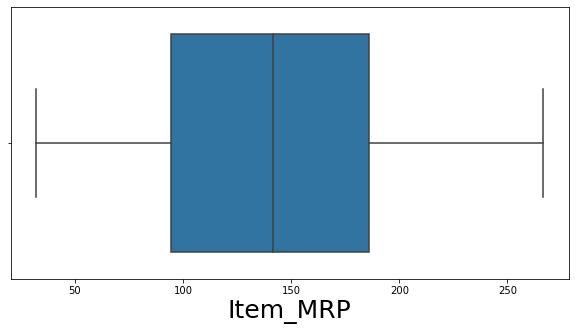

In [124]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata_Test['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

In [125]:
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')
bigdata_Test['Item_Weight']=scaler.fit_transform(bigdata_Test['Item_Weight'].values.reshape(-1, 1))
bigdata_Test['Item_Visibility']=scaler.fit_transform(bigdata_Test['Item_Visibility'].values.reshape(-1, 1))
bigdata_Test['Item_MRP']=scaler.fit_transform(bigdata_Test['Item_MRP'].values.reshape(-1, 1))

In [126]:
bigdata_Test.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
Outlet_Identifier_OUT017           0
O

In [127]:
 #lets use z score to remove outliers
from scipy.stats import zscore # z score represent the number of  standard deviation with which value of observation differ than mean value
z=np.abs(zscore(bigdata_Test['Item_Visibility']))
bigdata_Test['Item_Visibility']=bigdata_Test['Item_Visibility'][(z<3)]  # z score with std deviation =3

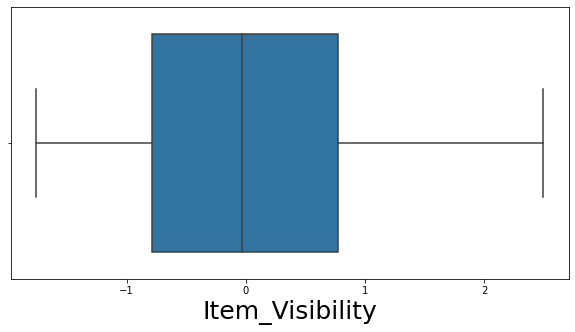

In [128]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata_Test['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

In [129]:
bigdata_Test.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
Outlet_Identifier_OUT017           0
O

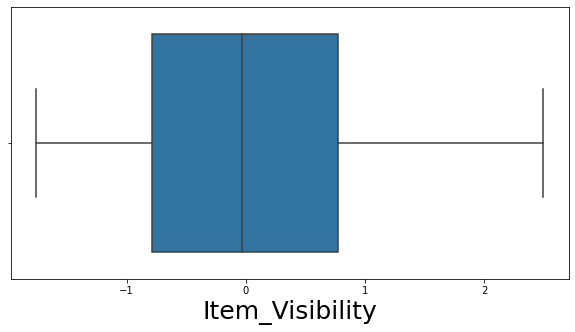

In [130]:
plt.figure(figsize=(10,5))
x=sns.boxplot(bigdata_Test['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

In [131]:
bigdata_Test.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
Outlet_Identifier_OUT017           0
O

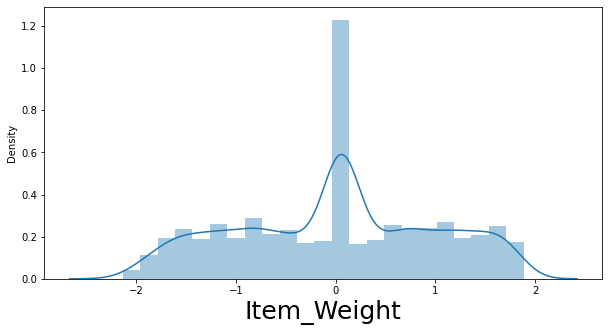

In [132]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_Weight'])
plt.xlabel('Item_Weight',fontsize=25)
plt.show()

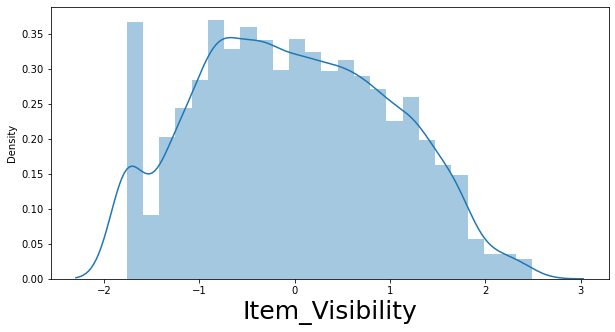

In [133]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_Visibility'])
plt.xlabel('Item_Visibility',fontsize=25)
plt.show()

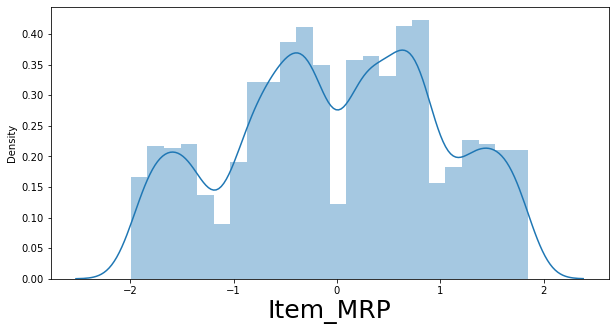

In [134]:
plt.figure(figsize=(10,5))
x=sns.distplot(bigdata_Test['Item_MRP'])
plt.xlabel('Item_MRP',fontsize=25)
plt.show()

In [135]:
bigdata_Test.isnull().sum()

Item_Weight                        0
Item_Visibility                    0
Item_MRP                           0
Item_Fat_Content_LF                0
Item_Fat_Content_Low Fat           0
Item_Fat_Content_Regular           0
Item_Fat_Content_low fat           0
Item_Fat_Content_reg               0
Item_Type_Baking Goods             0
Item_Type_Breads                   0
Item_Type_Breakfast                0
Item_Type_Canned                   0
Item_Type_Dairy                    0
Item_Type_Frozen Foods             0
Item_Type_Fruits and Vegetables    0
Item_Type_Hard Drinks              0
Item_Type_Health and Hygiene       0
Item_Type_Household                0
Item_Type_Meat                     0
Item_Type_Others                   0
Item_Type_Seafood                  0
Item_Type_Snack Foods              0
Item_Type_Soft Drinks              0
Item_Type_Starchy Foods            0
Outlet_Identifier_OUT010           0
Outlet_Identifier_OUT013           0
Outlet_Identifier_OUT017           0
O

In [136]:
list=['Item_Weight','Item_Visibility','Item_MRP']

In [137]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
bigdata_Test[list]=scaler.fit_transform(bigdata_Test[list])

In [138]:
bigdata_Test.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Fat_Content_LF,Item_Fat_Content_Low Fat,Item_Fat_Content_Regular,Item_Fat_Content_low fat,Item_Fat_Content_reg,Item_Type_Baking Goods,Item_Type_Breads,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,0.970931,0.070093,0.395950,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,0.273541,0.308477,0.301325,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,1,0,0
2,0.653234,0.618635,0.915213,0,1,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
3,0.206372,0.137360,0.594269,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
4,0.545762,0.685041,0.888996,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1


In [139]:
bigdata_Test.shape

(5681, 53)

here we check the shape of dataframe

In [148]:
x_train.shape

(6392, 53)

now we will load the model again for making prediction

In [141]:
# now load the model
model=joblib.load("Bigdata_train.pkl")
print(mod.predict(bigdata_Test))

[2087.283   515.3292  759.012  ... 1807.647  7247.233  2648.5524]


Here we get predicted value for labels